### Introduction
### Build a machine learning model to detect the weeds.

### Import necessary packages and libraries

In [1]:
import pandas as pd #dataframe manipulation
import numpy as np  #for numerical process
import seaborn as sns #for visualization
from matplotlib import pyplot as plt #for visualization
from PIL import Image, ImageDraw #for read the image
from tqdm.notebook import  tqdm_notebook
import skimage.color 
import skimage.util
import imagehash #for calculation hash value of image
import cv2 #for read the image
import os
import itertools
#import distance
import time
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

### Let's create to function to create a dataframe from the image folder 

In [2]:
def create_dataframe(image_path):
    """
    reading only annotation text files from the image folder and extracting the bounding box value and storing it in data frame format.
    """
    df=pd.DataFrame(columns=['image_name','image_path','x_c','y_c','w','h','class_label',])
    for files in tqdm_notebook(os.listdir(image_path)):
        if files.endswith('.txt'): #read only text file
            with open (f"{image_path}/{files}") as f:
                lines = f.readlines()
                for line in lines:
                    bbox = np.float64(line.split(" "))
                    x_c=bbox[1]
                    y_c=bbox[2]
                    w=bbox[3]
                    h=bbox[4] 
                    class_label=bbox[0]
                    image_name=files.replace(".txt",'.jpeg')
                    imagepath=f"{image_path}/{image_name}"              
                    res=[image_name,imagepath,x_c,y_c,w,h,class_label]
                    df.loc[len(df)] = res
            
    return df

### Create the dataframe

In [3]:
data=create_dataframe('/kaggle/input/hackerearth-oneapi-target-and-eliminate/data')

  0%|          | 0/2600 [00:00<?, ?it/s]

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2072 entries, 0 to 2071
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   image_name   2072 non-null   object 
 1   image_path   2072 non-null   object 
 2   x_c          2072 non-null   float64
 3   y_c          2072 non-null   float64
 4   w            2072 non-null   float64
 5   h            2072 non-null   float64
 6   class_label  2072 non-null   float64
dtypes: float64(5), object(2)
memory usage: 129.5+ KB


In [5]:
data.head()

,image_name,image_path,x_c,y_c,w,h,class_label
0,agri_0_9032.jpeg,/kaggle/input/hackerearth-oneapi-target-and-el...,0.500977,0.609375,0.939453,0.433594,0.0
1,agri_0_8733.jpeg,/kaggle/input/hackerearth-oneapi-target-and-el...,0.607422,0.573242,0.601562,0.564453,1.0
2,agri_0_6120.jpeg,/kaggle/input/hackerearth-oneapi-target-and-el...,0.546875,0.491211,0.906250,0.978516,0.0
3,agri_0_4362.jpeg,/kaggle/input/hackerearth-oneapi-target-and-el...,0.521484,0.489258,0.695312,0.560547,1.0
4,agri_0_9055.jpeg,/kaggle/input/hackerearth-oneapi-target-and-el...,0.490234,0.424805,0.554688,0.369141,1.0


In [6]:
data['image_name'].nunique()

1300

#### The image folder contains 1300 unique images and 2072 bounding box annotations with the two classes (crop, and weed).

### Let's map the class 0 as crop and 1 as a weed.

In [7]:
data['class_name']=data['class_label'].map({0.0:'crop',1.0:'weed'})

### Let's see class label distribution.

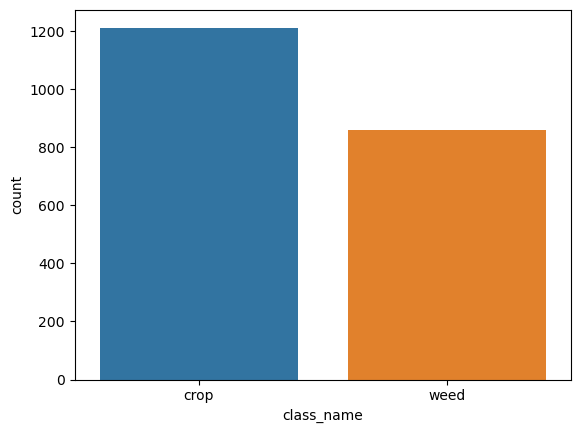

In [8]:
sns.countplot(x=data['class_name']);

In [9]:
data['class_name'].value_counts()

crop    1212
weed     860
Name: class_name, dtype: int64

#### The above plot and summary explain the low number of image samples for the weed class.

#### Let's see how many annotations each image has.

In [10]:
data['total_annotation']=data.groupby('image_name')['image_name'].transform('count')

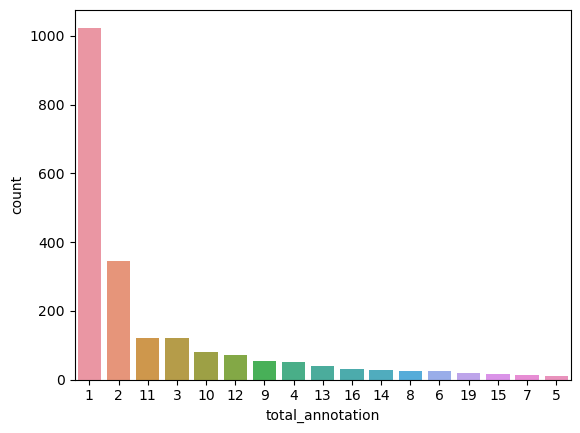

In [11]:
sns.countplot(x=data['total_annotation'], order=data['total_annotation'].value_counts().index);

In [12]:
data['total_annotation'].value_counts()

1     1024
2      344
11     121
3      120
10      80
12      72
9       54
4       52
13      39
16      32
14      28
8       24
6       24
19      19
15      15
7       14
5       10
Name: total_annotation, dtype: int64

#### The above plot explains that the images are annotated by the ranges from 1 to 19. Most of the images are annotated by either one or two times.

### Let's see image basic information like width, height, color mode.

In [13]:
def basic_image_info(df,col,path):
    imagename=[]
    img_mode=[]
    img_height=[]
    img_width=[]
    for files in tqdm_notebook(df[col].unique()):
        imagename.append(files)
        img=Image.open(f"{path}/{files}")
        img_mode.append(img.mode)
        img_width.append(img.width)
        img_height.append(img.height)
    return pd.DataFrame({'image_name':imagename,'img_mode':img_mode,'img_width':img_width,'img_height':img_height})
    

In [14]:
data_image_basic_info=basic_image_info(data,'image_name',"/kaggle/input/hackerearth-oneapi-target-and-eliminate/data")

  0%|          | 0/1300 [00:00<?, ?it/s]

In [15]:
data_image_basic_info.head()

,image_name,img_mode,img_width,img_height
0,agri_0_9032.jpeg,RGB,512,512
1,agri_0_8733.jpeg,RGB,512,512
2,agri_0_6120.jpeg,RGB,512,512
3,agri_0_4362.jpeg,RGB,512,512
4,agri_0_9055.jpeg,RGB,512,512


In [16]:
data_image_basic_info['img_mode'].unique()

array(['RGB'], dtype=object)

In [17]:
data_image_basic_info['img_width'].describe()

count    1300.0
mean      512.0
std         0.0
min       512.0
25%       512.0
50%       512.0
75%       512.0
max       512.0
Name: img_width, dtype: float64

In [18]:
data_image_basic_info['img_height'].describe()

count    1300.0
mean      512.0
std         0.0
min       512.0
25%       512.0
50%       512.0
75%       512.0
max       512.0
Name: img_height, dtype: float64

#### The above summary explains that all images' color mode is RGB. The image width and height are 512 pixels.

### Let's see the RGB color distribution of image.

In [19]:
def rgb_dist_plot(img,ax):
    start=0
    end=256
    for _,color in enumerate(['Red','Green','Blue']):
        _=sns.kdeplot(img.histogram()[start:end],label=color,color=color)
        _=plt.legend();
        start+=256
        end+=256

In [20]:
def image_and_rgb_dist(path,df,group,imgidcol):
    for im in df.groupby([group])[imgidcol].head(1):
        fig, axs = plt.subplots(1, 2 ,figsize=(15,5))
        img = Image.open(f"{(os.path.join(path, im))}")
        axs[0].imshow(img)
        axs[0].axis('off')
        axs[0].set_title(im,fontsize=18)
        _=rgb_dist_plot(img,ax=axs[1])
        axs[1].set_title("RGB Color Distribution For "+im,fontsize=18)
        

In [21]:
data_image_basic_info=pd.merge(data_image_basic_info,data[['image_name','total_annotation']],on='image_name',how='left')

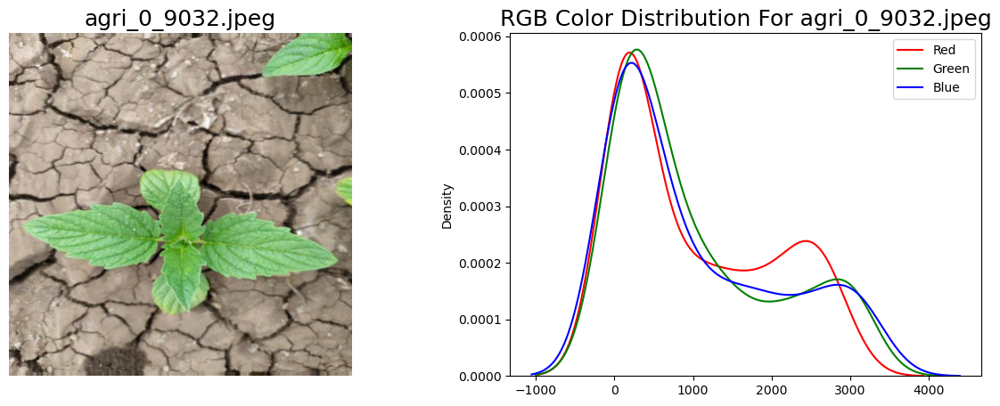

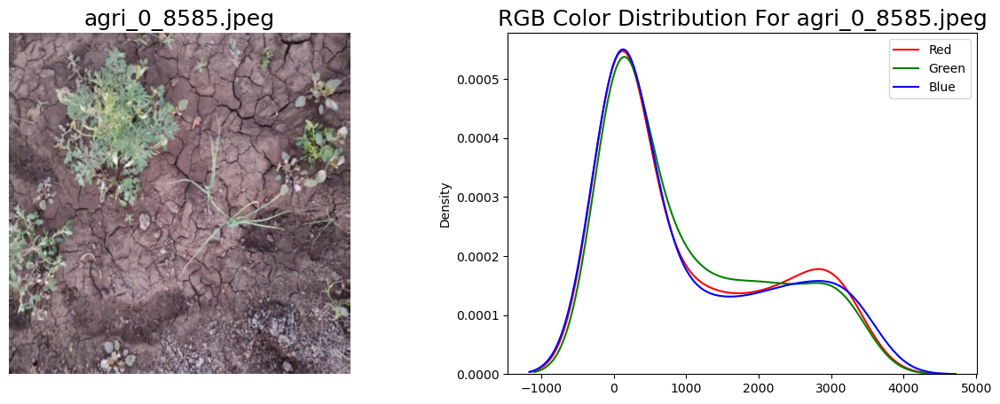

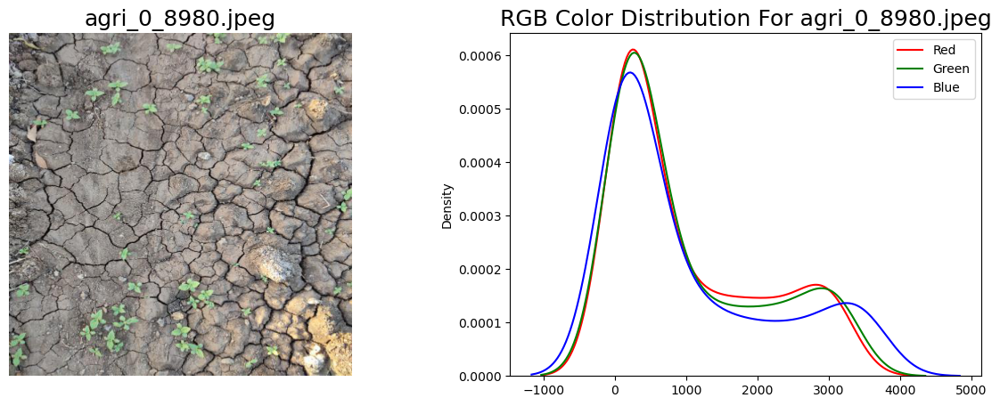

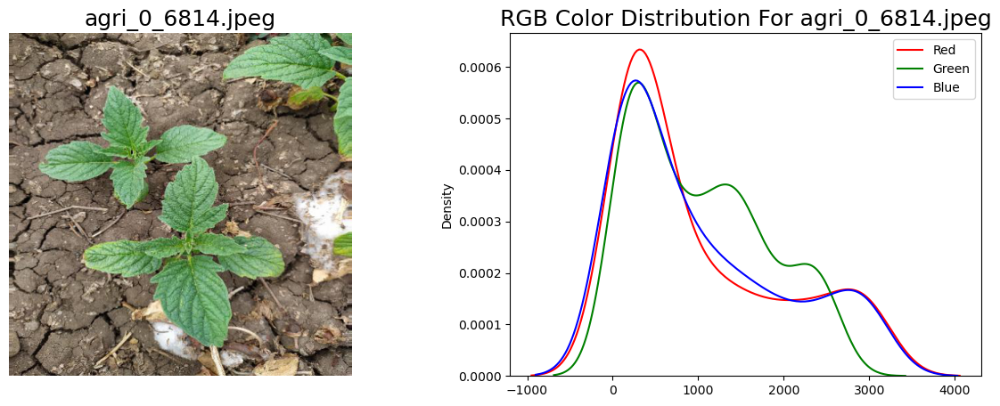

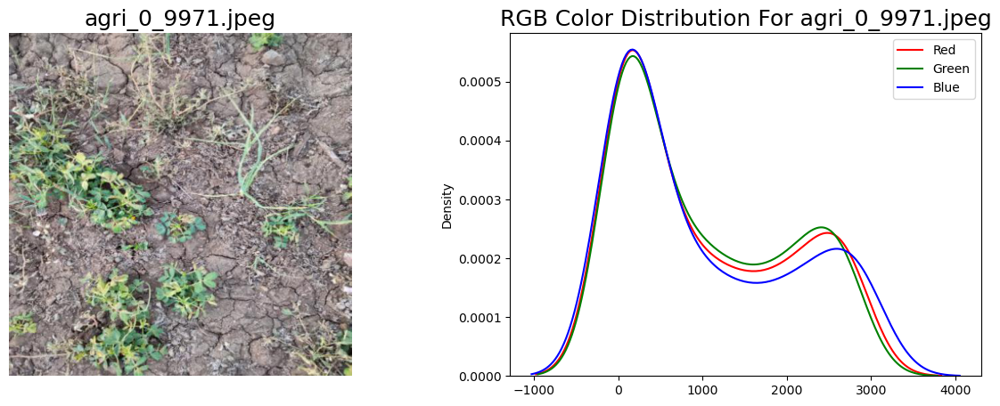

...

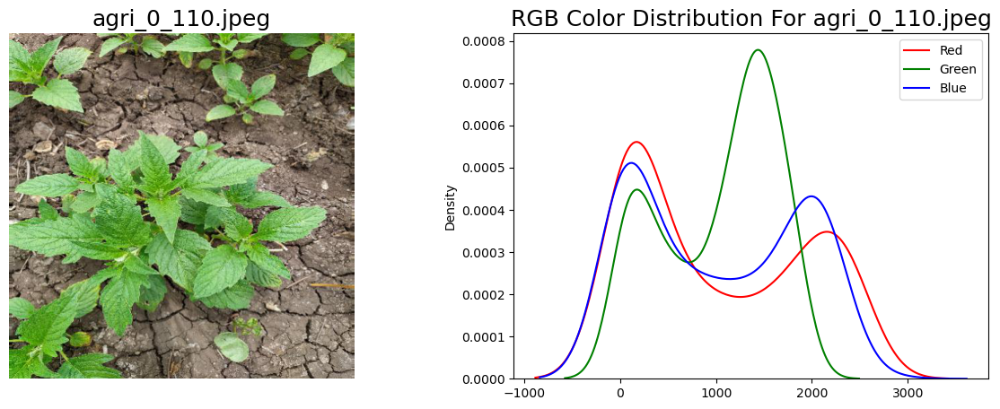

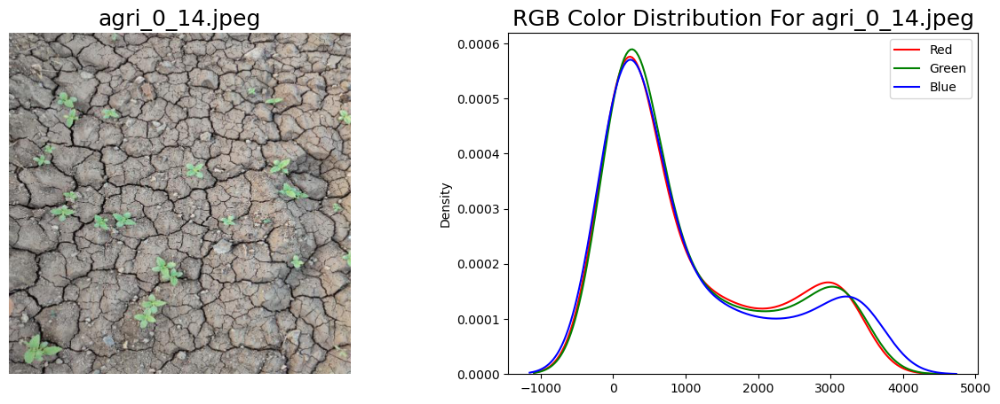

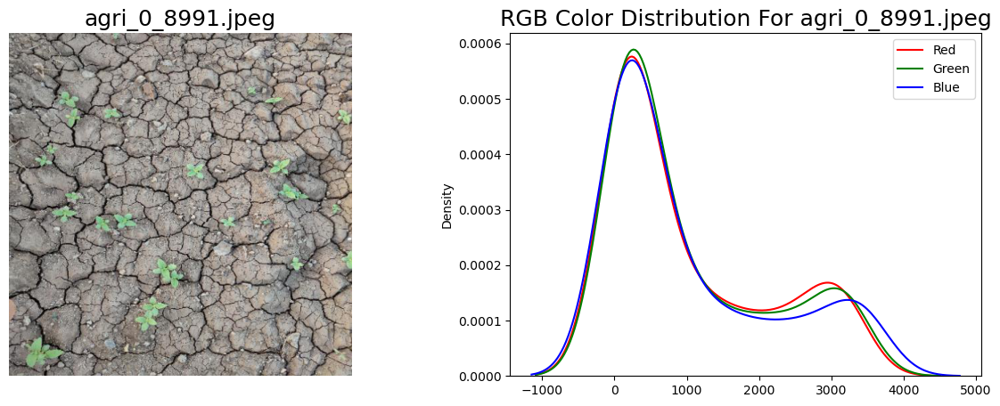

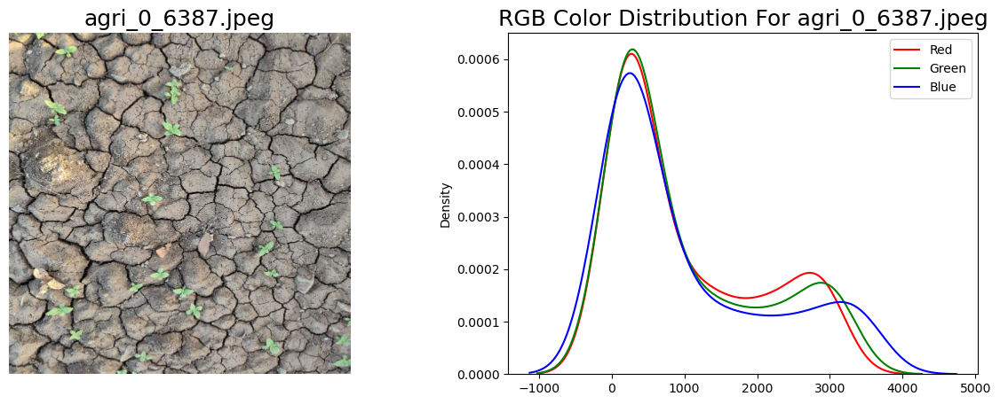

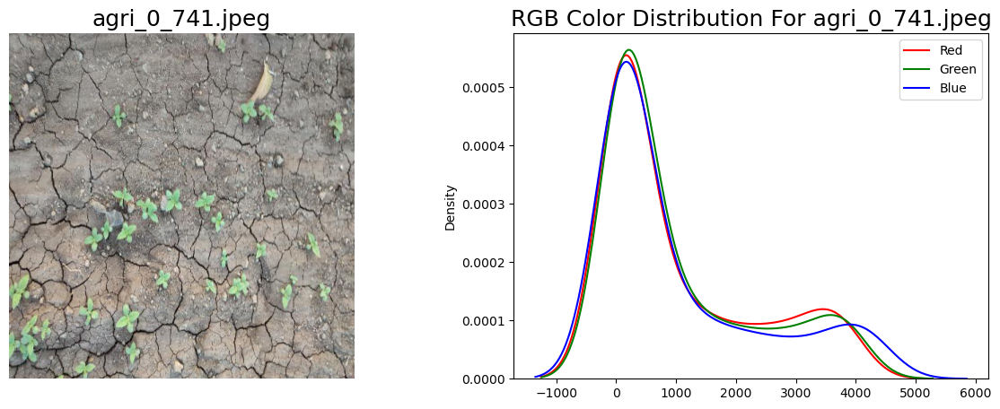

In [22]:
image_and_rgb_dist("/kaggle/input/hackerearth-oneapi-target-and-eliminate/data",
                   data_image_basic_info,'total_annotation','image_name')

#### All images are about the crops and some plants so the green colour is predominant.

#### Let's explore how images are annonated.

### Function to read the image.

In [23]:
def img_read(path,im ,new_size=False):
    img = cv2.imread(f"{(os.path.join(path, im))}")
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    if new_size:
        img=cv2.resize(img,(new_size,new_size))
    return img
        

### Function to convert the yolo annotation format to pascal voc format 

In [24]:
def yolo_to_pascal(box,img_size=512):
    x_c=box[0]*img_size
    y_c=box[1]*img_size
    w=box[2]*img_size
    h=box[3]*img_size


    x1=int(round(x_c - w/2))
    y1=int(round(y_c - h/2))
    x2=int(round(x_c + w/2)) 
    y2=int(round(y_c + h/2))
    
    
    return [x1,y1,x2,y2]

### Function to draw the bounding box on the image.

In [25]:
def bbbox_annotate(img,bbox_df,new_size=False):
    for index, row in bbox_df.iterrows():
        bbox=yolo_to_pascal([row['x_c'],row['y_c'],row["w"],row["h"]])
        if row['class_name']=='crop':
            imgs=(cv2.rectangle(img,(bbox[0],bbox[1]),
                                          (bbox[2],bbox[3]),(0,255,0),5))
        else:
            imgs=(cv2.rectangle(img,(bbox[0],bbox[1]),
                                          (bbox[2],bbox[3]),(255,0,0),5))          
    return imgs
        

#### Let's select and see one image by number annotation and class group.

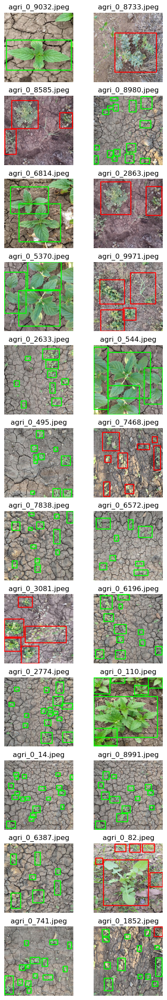

In [26]:
path="/kaggle/input/hackerearth-oneapi-target-and-eliminate/data/"
fig, axs = plt.subplots(12, 2 ,figsize=(5,30))
for i,(im,ax) in enumerate(zip(data.groupby(['total_annotation','class_name'])['image_name'].head(1),axs.flatten())):
    img=img_read(path,im)
    ax.imshow(bbbox_annotate(img,data[data['image_name']==im].iloc[:,np.r_[2:6,7]]))
    ax.axis('off')
    ax.set_title(f"{im}")

#### In the above images green bounding boxes are crop class.
#### Red bounding boxes are weed class.